In [1]:
%pip install matplotlib
%pip install pandas
%pip install seaborn
%pip install sklearn
%pip install scipy
%pip install tensorflow




[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip



Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


  Using cached sklearn-0.0.post12.tar.gz (2.6 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'error'
Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [15 lines of output]
      The 'sklearn' PyPI package is deprecated, use 'scikit-learn'
      rather than 'sklearn' for pip commands.
      
      Here is how to fix this error in the main use cases:
      - use 'pip install scikit-learn' rather than 'pip install sklearn'
      - replace 'sklearn' by 'scikit-learn' in your pip requirements files
        (requirements.txt, setup.py, setup.cfg, Pipfile, etc ...)
      - if the 'sklearn' package is used by one of your dependencies,
        it would be great if you take some time to track which package uses
        'sklearn' instead of 'scikit-learn' and report it to their issue tracker
      - as a last resort, set the environment variable
        SKLEARN_ALLOW_DEPRECATED_SKLEARN_PACKAGE_INSTALL=True to avoid this error
      
      More information is available at
      https://github.com/scikit-learn/sklearn-pypi-packag

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
%pip install -U scikit-learn
%pip install opencv-python

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# Importing all the required Libraries for Model

import tensorflow as tf 
from tensorflow import keras
from tensorflow.keras.models import Sequential                                                            
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D,MaxPooling2D, Dense, Dropout, Flatten, BatchNormalization,Activation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from matplotlib.image import imread
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.models import load_model
from tensorflow.keras import Model
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
import numpy as np 
import cv2
import os

# Removing all those annoying Warnings

import warnings                                                                                
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [3]:
#defining the path for the dataset
train_path = os.path.join(os.getcwd(),'OULP-C1V2_NormalizedSilhouette(64x64) - 1','OULP-C1V2_NormalizedSilhouette(64x64)','Seq00')
test_path = os.path.join(os.getcwd(),'OULP-C1V2_NormalizedSilhouette(64x64) - 1','OULP-C1V2_NormalizedSilhouette(64x64)','Seq01')
validation_path = os.path.join(os.getcwd(),'OULP-C1V2_NormalizedSilhouette(64x64) - 1','OULP-C1V2_NormalizedSilhouette(64x64)','Seq02')




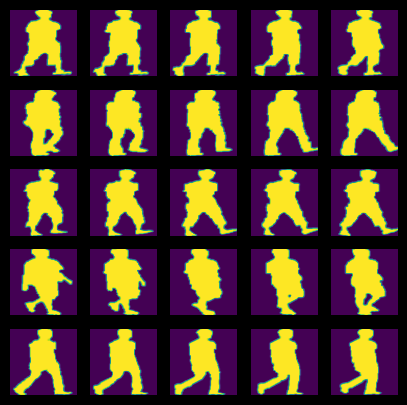

In [54]:
#define a function to plot some images from the dataset
def plot_images(path,n_images=5,n_objects=5):
    fig,ax = plt.subplots(n_objects,n_images,figsize=(n_images,n_objects))
    for i in range(n_objects):
        for j in range(n_images):
            ax[i,j].imshow(imread(os.path.join(path,os.listdir(path)[i],os.listdir(os.path.join(path,os.listdir(path)[i]))[j])))
            ax[i,j].axis('off')
    plt.show()

#plot some images from the dataset
plot_images(train_path)
#the dataset contains 2 folders 

In [2]:
#define a GEI function to create GEI images from the dataset
def GEI(path,n_frames=[3,5,8,10,15,20,25,30],n_images=8):
    #iterate through the objects in the dataset
    for ob in os.listdir(path):
        #randomly choose n consecutive frames from the dataset with n is in n_frames
        #do this n_images times
        for i in range(n_images):
            for n in n_frames:
                #randomly choose a starting frame
                start = np.random.randint(0,len(os.listdir(os.path.join(path,ob)))-n)
                #create a list of frames
                frames = os.listdir(os.path.join(path,ob))[start:start+n]
                #create a list of images from the list of frames
                images = [imread(os.path.join(path,ob,frame)) for frame in frames]
                #create a GEI image from the list of images
                GEI = np.sum(images,axis=0)/len(images)
                #save the GEI image
                cv2.imwrite(os.path.join(path,ob,str(n)+'-f'+'start'+str(start)+'.png'),np.uint8(GEI*255))



        


#call the GEI function to create GEI images from the dataset
GEI(test_path,n_frames=[3,4,6,9,12,17,22,28],n_images=4)
            


NameError: name 'test_path' is not defined

In [23]:
#remove the original images from the dataset
def remove1fGEI(path):
    for dirName, subdirList, fileList in os.walk(path):
        for fname in fileList:
            if '00000' in fname:  # Modify this line to match your naming convention
                os.remove(os.path.join(dirName, fname))
                print("Removed ", fname)
remove1fGEI(test_path)


Removed  00000028.png
Removed  00000029.png
Removed  00000030.png
Removed  00000031.png
Removed  00000032.png
Removed  00000033.png
Removed  00000034.png
Removed  00000035.png
Removed  00000036.png
Removed  00000037.png
Removed  00000038.png
Removed  00000039.png
Removed  00000040.png
Removed  00000041.png
Removed  00000042.png
Removed  00000043.png
Removed  00000044.png
Removed  00000045.png
Removed  00000046.png
Removed  00000047.png
Removed  00000048.png
Removed  00000049.png
Removed  00000050.png
Removed  00000051.png
Removed  00000052.png
Removed  00000053.png
Removed  00000054.png
Removed  00000055.png
Removed  00000056.png
Removed  00000057.png
Removed  00000058.png
Removed  00000059.png
Removed  00000060.png
Removed  00000061.png
Removed  00000062.png
Removed  00000063.png
Removed  00000064.png
Removed  00000065.png
Removed  00000066.png
Removed  00000067.png
Removed  00000068.png
Removed  00000069.png
Removed  00000070.png
Removed  00000071.png
Removed  00000072.png
Removed  0

In [21]:
import shutil

# Get a list of all folders in both directories
train_folders = set(os.listdir(train_path))
test_folders = set(os.listdir(test_path))

# Find the folders that are in the training set but not the test set
folders_to_delete = train_folders - test_folders
#find the folders that are in the test set but not the training set
folders_to_delete2 = test_folders - train_folders
#delete the folders that are in the training set but not the test set
for folder in folders_to_delete:
    shutil.rmtree(os.path.join(train_path, folder))
#delete the folders that are in the test set but not the training set
for folder in folders_to_delete2:
    shutil.rmtree(os.path.join(test_path, folder))

In [9]:
import random
#delete 10 random images in each folder of test set
for folder in os.listdir(test_path):
    for i in range(10):
        os.remove(os.path.join(test_path,folder,random.choice(os.listdir(os.path.join(test_path,folder)))))
        

In [9]:
import shutil
import random
# Get a list of all objects in the source directory
objects = [obj for obj in os.listdir(test_path) if os.path.isdir(os.path.join(test_path, obj))]

# For each object, move 10 random images to the validation directory
for obj in objects:
    obj_path = os.path.join(test_path, obj)
    images = [img for img in os.listdir(obj_path) if img.endswith('.png')]  # adjust this if your images are not .jpg
    selected_images = random.sample(images, 10)

    # Create a new directory in the validation directory for this object, if it doesn't exist
    new_dir = os.path.join(validation_path, obj)
    os.makedirs(new_dir, exist_ok=True)
    # Move the selected images
    for img in selected_images:
        src = os.path.join(obj_path, img)
        dst = os.path.join(new_dir, img)
        shutil.move(src, dst)

In [4]:
train_gen=ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=False, 
).flow_from_directory(
    directory=train_path, 
    target_size=(64,64), 
    color_mode='grayscale', 
    batch_size=32,
    class_mode='categorical', 
    shuffle=True, 
    seed=42       
)
test_gen=ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=False, 
).flow_from_directory(
    directory=test_path, 
    target_size=(64, 64), 
    color_mode='grayscale', 
    batch_size=32,
    class_mode='categorical', 
    shuffle=False, 
    seed=42 
)
validation_gen=ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=False, 
).flow_from_directory(
    directory=validation_path, 
    target_size=(64, 64), 
    color_mode='grayscale', 
    batch_size=32,
    class_mode='categorical', 
    shuffle=True, 
    seed=42 
)

Found 201588 images belonging to 3844 classes.
Found 121456 images belonging to 3844 classes.
Found 76527 images belonging to 3844 classes.


In [5]:
no_of_classes = len(os.listdir(train_path))

In [8]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPooling2D, Dense, Dropout, Flatten, BatchNormalization,Activation
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, Activation
from tensorflow.keras.optimizers import Adam

# Defining the number of classes, number of classes = number of subjects in the dataset


model = Sequential()

# 1st CNN layer, input size = 64x64x1, filter size = 5x5x32
model.add(Conv2D(32, (7, 7), padding='same', input_shape=(64, 64, 1)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))                                                       # MaxPooling2D reduces the size of the image by half
model.add(Dropout(0.25))                                                                         # Dropout is used to prevent overfitting



# 2nd CNN layer
model.add(Conv2D(128, (5, 5), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

# 3rd CNN layer
model.add(Conv2D(512, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

# 4th CNN layer
model.add(Conv2D(512, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())

# Fully connected 1st layer
model.add(Dense(256))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.25))

# Fully connected 2nd layer
model.add(Dense(512))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.25))

# Output layer
model.add(Dense(no_of_classes, activation='softmax'))
opt = Adam(lr=0.01)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 32)        1600      
                                                                 
 batch_normalization (Batch  (None, 64, 64, 32)        128       
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 64, 64, 32)        0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 32)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 32, 32, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 128)       1

In [9]:
# Adding various Call Backs Like Early stopping to prevent overfitting and Decay Learning Rate to prevent Overshooting

checkpoint = ModelCheckpoint('./my_model.h5', monitor='val_acc', verbose=1, save_best_only=True, mode='max')          # Adding various Call Backs Like Early stopping to prevent overfitting and Decay Learning Rate to prevent Overshooting

#early stopping
early_stopping=EarlyStopping(monitor='val_accuracy',
                            min_delta=0,
                            patience=3,
                            verbose=1,
                            restore_best_weights=True)
decay_lr= ReduceLROnPlateau(monitor='val_loss',
                           factor=0.2,
                           patience=3,
                           verbose=1,
                           min_delta=0.0001)
callbacks=[early_stopping,checkpoint,decay_lr]


In [10]:
#fitting the generator
history = model.fit_generator(train_gen, epochs=15, validation_data=validation_gen, callbacks=callbacks)



Epoch 1/15



6300/6300 [==============================] - ETA: 0s - loss: 4.8084 - accuracy: 0.1761WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 2224s 353ms/step - loss: 4.8084 - accuracy: 0.1761 - val_loss: 1.6644 - val_accuracy: 0.5843 - lr: 0.0010
Epoch 2/15
6300/6300 [==============================] - ETA: 0s - loss: 1.2514 - accuracy: 0.6630WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 2139s 340ms/step - loss: 1.2514 - accuracy: 0.6630 - val_loss: 0.8602 - val_accuracy: 0.7885 - lr: 0.0010
Epoch 3/15
6300/6300 [==============================] - ETA: 0s - loss: 0.6685 - accuracy: 0.8105WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 13546s 2s/step - loss: 0.6685 - accuracy: 0.8105 - val_loss: 0.3956 - val_accuracy: 0.9055 - lr: 0.0010
Epoch 4/15
6300/6300 [==============================] - ETA: 0s - loss: 0.4628 - accuracy: 0.8651WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 4913s 780ms/step - loss: 0.4628 - accuracy: 0.8651 - val_loss: 0.4316 - val_accuracy: 0.9002 - lr: 0.0010
Epoch 5/15
6300/6300 [==============================] - ETA: 0s - loss: 0.3507 - accuracy: 0.8956WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 3503s 556ms/step - loss: 0.3507 - accuracy: 0.8956 - val_loss: 0.7237 - val_accuracy: 0.8402 - lr: 0.0010
Epoch 6/15
6300/6300 [==============================] - ETA: 0s - loss: 0.2850 - accuracy: 0.9154WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 2978s 473ms/step - loss: 0.2850 - accuracy: 0.9154 - val_loss: 0.2783 - val_accuracy: 0.9386 - lr: 0.0010
Epoch 7/15
6300/6300 [==============================] - ETA: 0s - loss: 0.2406 - accuracy: 0.9273WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 3007s 477ms/step - loss: 0.2406 - accuracy: 0.9273 - val_loss: 0.2766 - val_accuracy: 0.9403 - lr: 0.0010
Epoch 8/15
6300/6300 [==============================] - ETA: 0s - loss: 0.2078 - accuracy: 0.9372WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 29897s 5s/step - loss: 0.2078 - accuracy: 0.9372 - val_loss: 0.2580 - val_accuracy: 0.9454 - lr: 0.0010
Epoch 9/15
6300/6300 [==============================] - ETA: 0s - loss: 0.1812 - accuracy: 0.9444WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 2932s 465ms/step - loss: 0.1812 - accuracy: 0.9444 - val_loss: 0.2705 - val_accuracy: 0.9421 - lr: 0.0010
Epoch 10/15
6300/6300 [==============================] - ETA: 0s - loss: 0.1634 - accuracy: 0.9498WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 12274s 2s/step - loss: 0.1634 - accuracy: 0.9498 - val_loss: 0.2319 - val_accuracy: 0.9525 - lr: 0.0010
Epoch 11/15
6300/6300 [==============================] - ETA: 0s - loss: 0.1454 - accuracy: 0.9551WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 4020s 638ms/step - loss: 0.1454 - accuracy: 0.9551 - val_loss: 0.2169 - val_accuracy: 0.9572 - lr: 0.0010
Epoch 12/15
6300/6300 [==============================] - ETA: 0s - loss: 0.1322 - accuracy: 0.9591WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 26875s 4s/step - loss: 0.1322 - accuracy: 0.9591 - val_loss: 0.2075 - val_accuracy: 0.9606 - lr: 0.0010
Epoch 13/15
6300/6300 [==============================] - ETA: 0s - loss: 0.1213 - accuracy: 0.9622WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 4204s 667ms/step - loss: 0.1213 - accuracy: 0.9622 - val_loss: 0.2142 - val_accuracy: 0.9579 - lr: 0.0010
Epoch 14/15
6300/6300 [==============================] - ETA: 0s - loss: 0.1101 - accuracy: 0.9655WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 3065s 486ms/step - loss: 0.1101 - accuracy: 0.9655 - val_loss: 0.2238 - val_accuracy: 0.9561 - lr: 0.0010
Epoch 15/15
6300/6300 [==============================] - ETA: 0s - loss: 0.1067 - accuracy: 0.9669WARNING:tensorflow:Can save best model only with val_acc available, skipping.


6300/6300 [==============================] - 3759s 597ms/step - loss: 0.1067 - accuracy: 0.9669 - val_loss: 0.1965 - val_accuracy: 0.9636 - lr: 0.0010


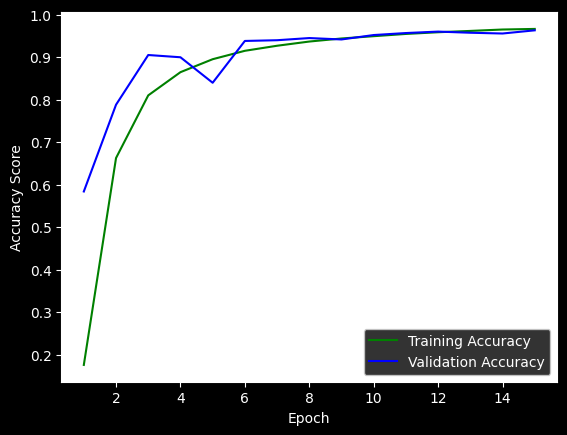

In [47]:
# Extract accuracy and validation accuracy from history
accuracy = [0.1761, 0.6630, 0.8105, 0.8651, 0.8956, 0.9154, 0.9273, 0.9372, 0.9444, 0.9498, 0.9551, 0.9591, 0.9622, 0.9655, 0.9669]
val_accuracy = [0.5843, 0.7885, 0.9055, 0.9002, 0.8402, 0.9386, 0.9403, 0.9454, 0.9421, 0.9525, 0.9572, 0.9606, 0.9579, 0.9561, 0.9636]

# Create count of the number of epochs
epoch_count = range(1, len(accuracy) + 1)

# Create a figure and axes
fig, ax = plt.subplots()

# Set the background color of the axes
ax.set_facecolor('white')

# Plot the data
ax.plot(epoch_count, accuracy, 'g-')
ax.plot(epoch_count, val_accuracy, 'b-')

# Add labels and title
ax.set_xlabel('Epoch')
ax.set_ylabel('Accuracy Score')
ax.legend(['Training Accuracy', 'Validation Accuracy'])

# Show the plot
plt.show()

In [11]:
#save the model
model.save('7layersCNN.h5')

In [6]:
#load the model
model = load_model('7layersCNN.h5')

In [8]:
#Get the predictions from the model, the first images of the first object in test set to see if the model is working
#only load 1 image for model to save time
test_image = imread(os.path.join(test_path,os.listdir(test_path)[0],os.listdir(os.path.join(test_path,os.listdir(test_path)[0]))[0]))
test_image = cv2.resize(test_image,(64,64))
test_image = np.expand_dims(test_image, axis=0)
test_image = np.expand_dims(test_image, axis=3)
result = model.predict(test_image)
print(result)
print(np.argmax(result))
print(os.listdir(test_path)[np.argmax(result)])

1/1 [==============================] - 0s 479ms/step
[[9.9999821e-01 0.0000000e+00 2.8574809e-07 ... 7.1968739e-37
  0.0000000e+00 1.0316664e-31]]
0
0000024


In [34]:
#get the predictions from the model
Y_pred = model.predict_generator(test_gen)
y_pred = np.argmax(Y_pred, axis=1)




KeyboardInterrupt: 

In [52]:
np.save('Y_pred.npy',Y_pred)

In [36]:
print('Confusion Matrix')
cm = confusion_matrix(test_gen.classes, y_pred)
print(cm)

Confusion Matrix
[[32  0  0 ...  0  0  0]
 [ 0 29  0 ...  0  0  0]
 [ 0  0 31 ...  0  0  0]
 ...
 [ 0  0  0 ... 16  0  0]
 [ 0  0  0 ...  0 32  0]
 [ 0  0  0 ...  0  0 31]]


In [35]:
#calculate accuracy
print('Accuracy')
print(accuracy_score(test_gen.classes, y_pred))


Accuracy
0.919394677908049


In [51]:
#calculate classification report
print('Classification Report')
target_names = os.listdir(test_path)
print(classification_report(test_gen.classes, y_pred, target_names=target_names))


Classification Report
              precision    recall  f1-score   support

     0000024       0.80      1.00      0.89        32
     0000032       0.91      0.94      0.92        31
     0000035       0.97      0.97      0.97        32
     0000036       1.00      0.88      0.93        32
     0000037       0.73      1.00      0.84        32
     0000038       1.00      1.00      1.00        32
     0000039       1.00      0.86      0.93        29
     0000040       0.97      0.88      0.92        32
     0000041       1.00      0.97      0.98        30
     0000042       0.67      0.97      0.79        32
     0000043       0.91      0.97      0.94        32
     0000044       1.00      1.00      1.00        32
     0000045       1.00      1.00      1.00        32
     0000046       0.91      0.94      0.92        32
     0000047       0.97      0.97      0.97        30
     0000048       0.94      1.00      0.97        32
     0000049       0.91      0.94      0.92        31
     

FAR: [6.58848333e-05 2.47066090e-05 8.23560416e-06 ... 0.00000000e+00
 0.00000000e+00 1.64712083e-05]
FRR: [0.         0.06451613 0.03125    ... 0.48387097 0.         0.03125   ]


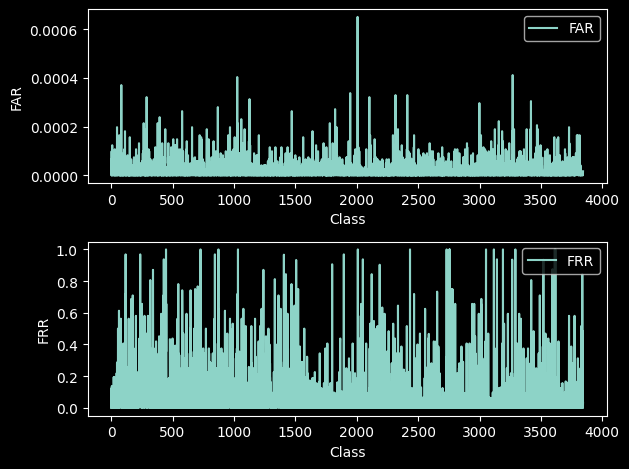

In [83]:
#calculate FRR,FAR
TP = np.diag(cm)
FP = np.sum(cm, axis=0) - TP
FN = np.sum(cm, axis=1) - TP
TN = np.sum(cm) - (FP + FN + TP)
# False Acceptance Rate (FAR)
FAR = FP / (FP + TN)

# False Rejection Rate (FRR)
FRR = FN / (TP + FN)

print('FAR:', FAR)
print('FRR:', FRR)
fig, axs = plt.subplots(2)

# Plot FAR
axs[0].plot(FAR)
axs[0].set_ylabel('FAR')
axs[0].set_xlabel('Class')
axs[0].legend(['FAR'], loc='upper right')

# Plot FRR
axs[1].plot(FRR)
axs[1].set_ylabel('FRR')
axs[1].set_xlabel('Class')
axs[1].legend(['FRR'], loc='upper right')

plt.tight_layout()
plt.show()



In [59]:
#print the highest FAR and FRR
print('Highest FAR:', max(FAR))
print('Highest FRR:', max(FRR))
#print the class with the highest FAR and FRR
print('Class with highest FAR:', np.argmax(FAR))
print('Class with highest FRR:', np.argmax(FRR))
#check for this class in the confusion matrix
print('Confusion Matrix')
#print full confusion matrix
print(cm[np.argmax(FAR)])
print('Confusion Matrix')
print(cm[np.argmax(FRR)])
#print the lowest FAR and FRR
print('Lowest FAR:', min(FAR))
print('Lowest FRR:', min(FRR))
#print the class with the lowest FAR and FRR
print('Class with lowest FAR:', np.argmin(FAR))
print('Class with lowest FRR:', np.argmin(FRR))


Highest FAR: 0.0006506127289497958
Highest FRR: 1.0
Class with highest FAR: 2007
Class with highest FRR: 447
Confusion Matrix
[0 0 0 ... 0 0 0]
Confusion Matrix
[0 0 0 ... 0 0 0]
Lowest FAR: 0.0
Lowest FRR: 0.0
Class with lowest FAR: 3
Class with lowest FRR: 0


In [ ]:
# Get the directory with the highest FAR
dir_with_highest_FAR = os.listdir(test_path)[np.argmax(FRR)]

# Get the list of files in that directory
files_in_dir = os.listdir(os.path.join(test_path, dir_with_highest_FAR))

# Iterate over all images in the directory
for i in range(len(files_in_dir)):
    # Read the i-th image in the directory
    test_image = imread(os.path.join(test_path, dir_with_highest_FAR, files_in_dir[i]))
    test_image = cv2.resize(test_image,(64,64))
    test_image = np.expand_dims(test_image, axis=0)
    test_image = np.expand_dims(test_image, axis=3)
    result = model.predict(test_image)
    predicted_class = os.listdir(test_path)[np.argmax(result)]
    print('predicted class:',predicted_class)
    # Print the image that the model predicts wrong
    if predicted_class != dir_with_highest_FAR:
        print('actual class:',dir_with_highest_FAR)
        plt.imshow(test_image.squeeze(), cmap='gray')
        plt.axis('off')
        plt.show()
        predicted_image = imread(os.path.join(test_path, predicted_class, os.listdir(os.path.join(test_path, predicted_class))[i]))
        print('predicted class:',predicted_class)
        plt.imshow(predicted_image, cmap='gray')
        plt.axis('off')
        plt.show()
#print the actual class of the image
print(dir_with_highest_FAR)

In [87]:
#take all the classes that have FRR > 0.1 to fine tune the model
classes_to_fine_tune = []
for i in range(len(FRR)):
    if FRR[i] > 0.1:
        classes_to_fine_tune.append(i)
#find these classes in folder "OULP-C1V2_NormalizedSilhouette(64x64) - 3\OULP-C1V2_NormalizedSilhouette(64x64)\Seq00" then generate GEI images from them to fine tune the model
fine_tune_path = os.path.join(os.getcwd(),'OULP-C1V2_NormalizedSilhouette(64x64) - 3','OULP-C1V2_NormalizedSilhouette(64x64)','Seq00')
n_images = 3
n_frames = [3,5,8,10,15,20,25,30]
for i in classes_to_fine_tune:
        #randomly choose n consecutive frames from the dataset with n is in n_frames
        #do this n_images times
        obj = os.listdir(fine_tune_path)[i]
        for i in range(n_images):
            for n in n_frames:
                #randomly choose a starting frame
                start = np.random.randint(0,len(os.listdir(os.path.join(fine_tune_path,obj)))-n)
                #create a list of frames
                frames = os.listdir(os.path.join(fine_tune_path,obj))[start:start+n]
                #create a list of images from the list of frames
                images = [imread(os.path.join(fine_tune_path,obj,frame)) for frame in frames]
                # Create a GEI image from the list of images
                GEI = np.sum(images,axis=0)/len(images)

                # Define the output directory
                output_dir = os.path.join(os.getcwd(),'OULP-C1V2_NormalizedSilhouette(64x64) - 1','OULP-C1V2_NormalizedSilhouette(64x64)','fine tune',obj)

                # Create the directory if it does not exist
                os.makedirs(output_dir, exist_ok=True)

                # Save the GEI image in the 'fine tune' directory
                cv2.imwrite(os.path.join(output_dir, str(n)+'-f'+'start'+str(start)+'.png'),np.uint8(GEI*255))


                
    

In [88]:
fine_tune_path = os.path.join(os.getcwd(),'OULP-C1V2_NormalizedSilhouette(64x64) - 1','OULP-C1V2_NormalizedSilhouette(64x64)','fine tune')
fine_tune_gen=ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=False, 
).flow_from_directory(
    directory=fine_tune_path,
    target_size=(64,64), 
    color_mode='grayscale', 
    batch_size=32,
    class_mode='categorical', 
    shuffle=True, 
    seed=42       
)

Found 19334 images belonging to 815 classes.


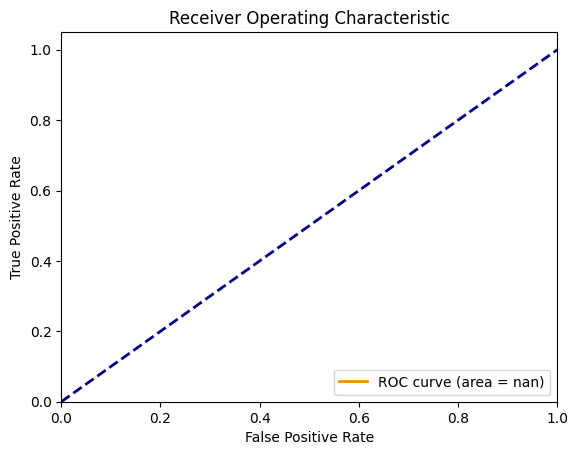

In [10]:
#load the Y_pred.npy file
Y_pred = np.load('Y_pred.npy')
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer

# Initialize an empty list to store the true labels
Y_true = []

# Iterate over the test generator
for _, labels in test_gen:
    Y_true.extend(labels)
    
    # Stop iterating once we've collected enough labels
    if len(Y_true) >= 500:
        break

# Convert the list to a numpy array
Y_true = np.array(Y_true[:500])  # Only keep the first 500 labels

# Save the true labels for future use
np.save('Y_true.npy', Y_true)
# Load the predicted scores
Y_scores = np.load('Y_pred.npy')

# Only keep the scores for the first 500 samples
Y_scores = Y_scores[:500]

# The rest of your code...

# Binarize the true labels
lb = LabelBinarizer()
Y_true_bin = lb.fit_transform(Y_true)

# Compute the ROC curve and ROC area for each of the first 500 classes
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(500):  # Only consider the first 500 classes
    fpr[i], tpr[i], _ = roc_curve(Y_true_bin[:, i], Y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(Y_true_bin[:, :500].ravel(), Y_scores[:, :500].ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc["micro"])
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()